<a href="https://colab.research.google.com/github/sumaiya008/CCNY-DSE-Capstone-Project-Segmenting-Coral-Branch-tips/blob/main/car_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive

drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
import cv2
import os

# Path to the directory containing images
image_dir = '/content/drive/MyDrive/CV_Project/Car_data/train/images/'

# Output video file path
output_video_path = '/content/drive/MyDrive/CV_Project/Car_data/video.avi'

# Get the list of image files in the directory
image_files = [img for img in os.listdir(image_dir) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Sort the image files to maintain order
image_files.sort()

# Get the dimensions of the first image (assuming all images have the same dimensions)
first_image_path = os.path.join(image_dir, image_files[0])
first_image = cv2.imread(first_image_path)
height, width, _ = first_image.shape

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'XVID')  # You can change the codec as needed
fps = 24  # Frames per second
video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Write each image to the video file
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    frame = cv2.imread(image_path)
    video_writer.write(frame)

# Release the video writer
video_writer.release()

print("Video created successfully!")


Video created successfully!


In [7]:
cap = cv2.VideoCapture('/content/drive/MyDrive/CV_Project/Car_data/video.avi')

In [8]:
car_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Project/Car_data/haarcascade_cars.xml')

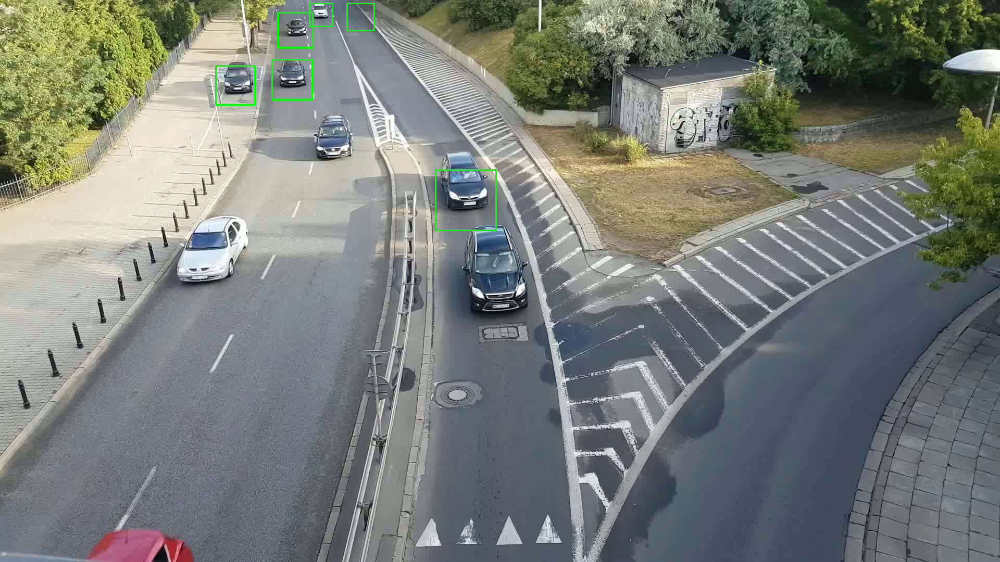

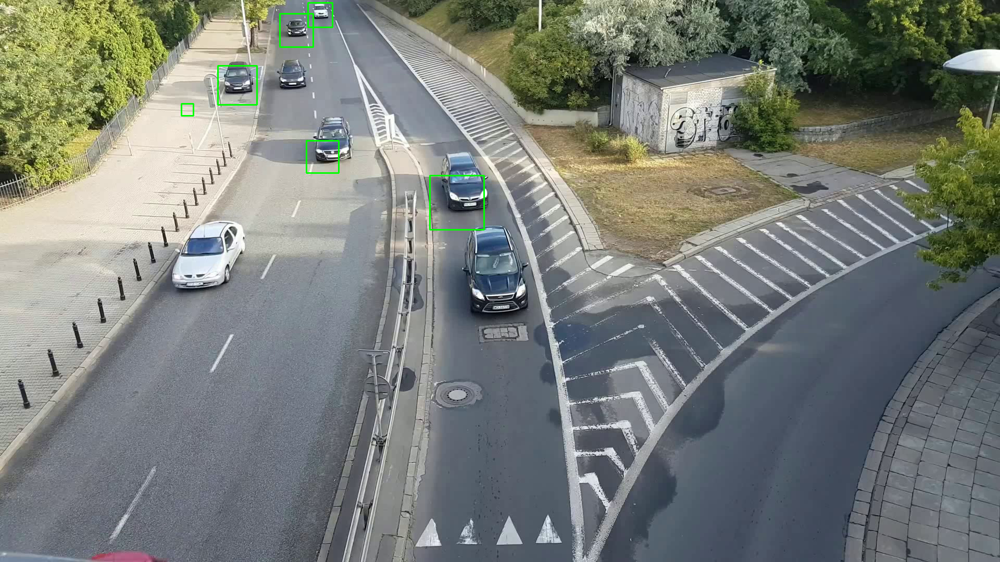

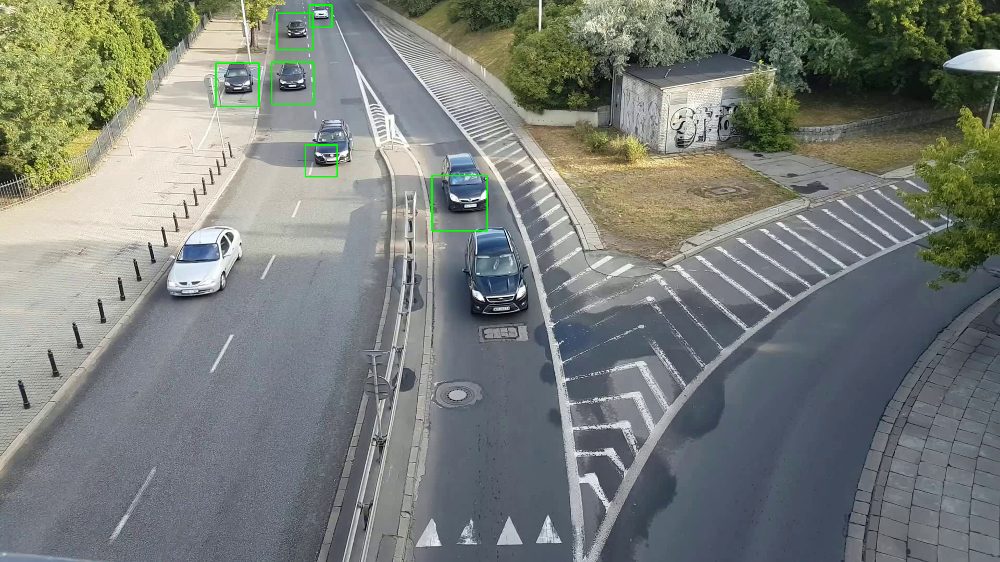

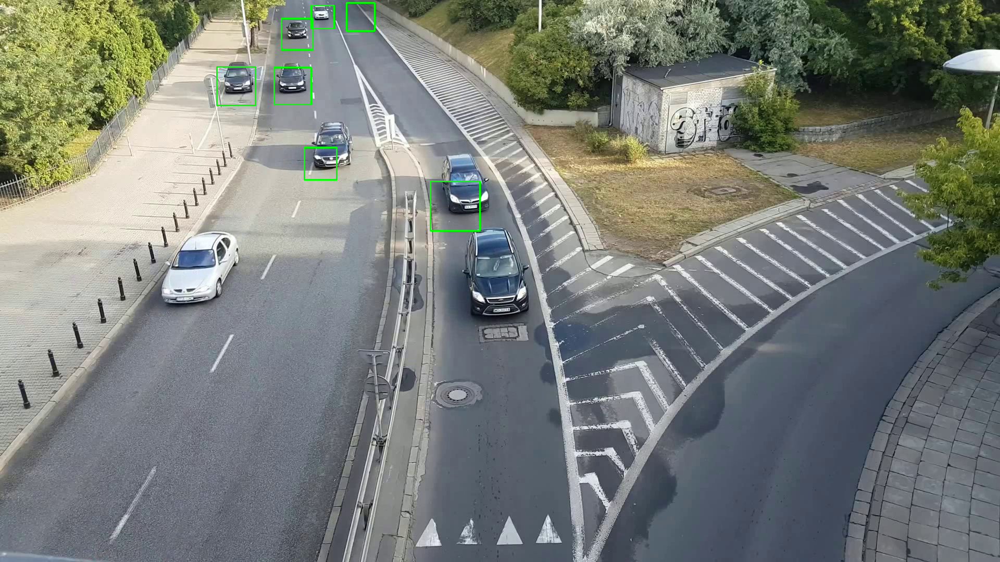

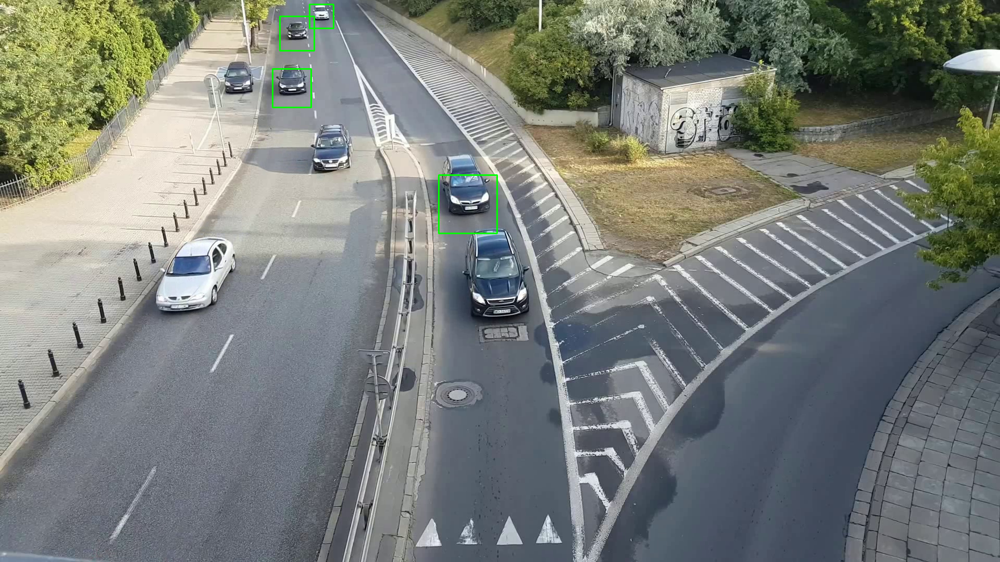

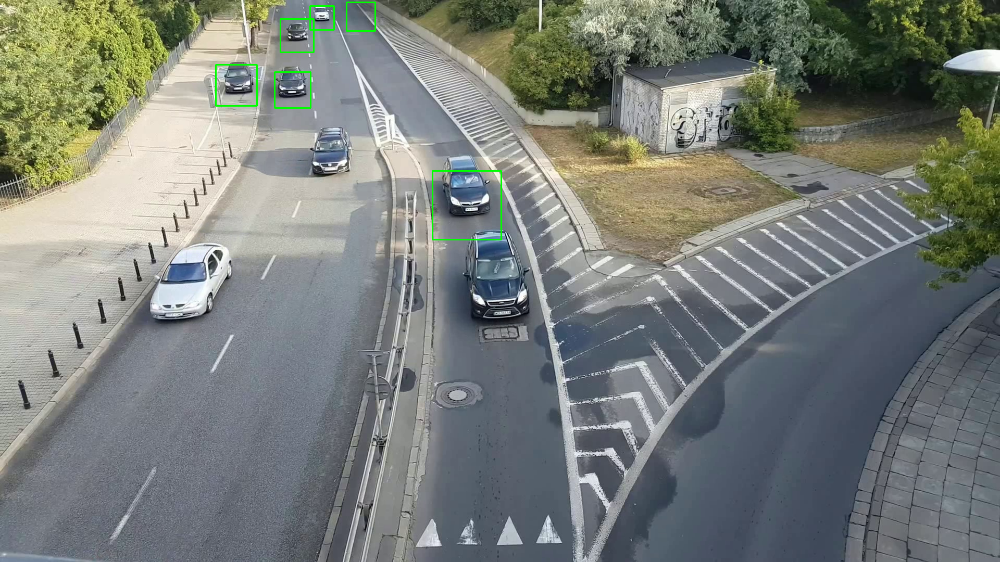

In [ ]:
cap = cv2.VideoCapture('/content/drive/MyDrive/CV_Project/Car_data/video.avi')
car_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Project/Car_data/haarcascade_cars.xml')

# Read until the video is completed
while True:
    # Capture frame by frame
    ret, frame = cap.read()

    # Convert the video into grayscale for each frame
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect cars in the video
    cars = car_cascade.detectMultiScale(gray, 1.1, 3)

    # To draw a rectangle around each car
    for (x, y, w, h) in cars:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
        crop_img = frame[y:y+h, x:x+w]

    # Display the frame using cv2_imshow (Google Colab-specific function)
    from google.colab.patches import cv2_imshow
    cv2_imshow(frame)

    # Press 'Q' on the keyboard to exit
    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

# Release the video-capture object
cap.release()
# Close all the frames
cv2.destroyAllWindows()
